# Rainfall Prediction - Weather Forecasting# 

**Rain Prediction –Weather forecasting**

**Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.**

**Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:**

**Problem Statement:** 

**a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.(Classification)**

**b)Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.(Regression)**

In [190]:
#Importing necessary Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [191]:
df = pd.read_csv('weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


                              **Observations**

**We need to split Date column in Day,Date & Month in order to understand the predictions better**

**We need to check the unique values present in Dataset in order to check any blank spaces to replace**

**Encoding is required ,Post EDA we will Encode the columns accordingly with their Object Type**

In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [193]:
df.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

**These two columns are holding null values above 40%**

**41.64% null values are present in Evaporation**

**47.40% null values are present in Sunshine**


**Filling this much percentage of null values are not logical,We will drop these columns**

**Null values of all other columns will be filled**

**Splitting date into Days/Months/year and creating new columns for same post creation of new columns i will delete the Date Column**



In [194]:
df['Date']=df['Date'].astype(str)

In [195]:
df['Year'], df['Month'], df['Day'] = df['Date'].str.split('-').str
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,01
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,02
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,03
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,04
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,05


**Dropping Date column**

In [196]:
df.drop(columns=['Date'],inplace=True)

In [197]:
df.drop(columns=['Evaporation','Sunshine'],inplace=True)

**Checking Shape of Dataset post deletion of Columns**

In [198]:
df.shape

(8425, 23)

**Duplicate Values in Dataset**

In [199]:
print(f"Rows and Columns before dropping duplicates: ", df.shape)
df.drop_duplicates(inplace=True)
print(f"Rows and Columns after dropping duplicates: ", df.shape)

Rows and Columns before dropping duplicates:  (8425, 23)
Rows and Columns after dropping duplicates:  (6762, 23)


In [200]:
print("Percentage Loss after deleting Duplicate Values is :",1663/8425*100)

Percentage Loss after deleting Duplicate Values is : 19.73887240356083


**Lets seprate Integer/Float and Object Data type columns**

In [201]:
object_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'O':
        object_datatype.append(x)
print(f"Object Data Type Columns are:\n", object_datatype)

Object Data Type Columns are:
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow', 'Year', 'Month', 'Day']


In [202]:
numeric_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'float64' or df.dtypes[x] == 'int64':
        numeric_datatype.append(x)
print(f"\nNumber Data Type Columns are:\n", numeric_datatype)


Number Data Type Columns are:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


**Checking Uniques Values in Columns**

In [203]:
for col in object_datatype:
    print(col)
    print(df[col].value_counts())
    print("="*120)

Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64
WindGustDir
E      518
SW     465
N      459
W      434
WSW    420
WNW    398
SSE    390
S      376
SE     370
ENE    357
NE     300
SSW    299
NW     296
NNE    287
ESE    267
NNW    184
Name: WindGustDir, dtype: int64
WindDir9am
N      609
SW     590
NW     463
SE     439
ENE    397
WSW    394
SSW    368
NE     364
E      338
NNE    337
S      324
WNW    301
SSE    300
W      299
ESE    229
NNW    216
Name: WindDir9am, dtype: int64
WindDir3pm
SE     677
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64
RainToday
No     5052
Yes    1572
Name: RainToday, dty

**Class Imbalance has been Observed in our target Variable for Classification Model**

**Filling Values**

In [204]:
#Continuous columns with Mean

df['MinTemp']=df['MinTemp'].fillna(df['MinTemp'].mean())
df['MaxTemp']=df['MaxTemp'].fillna(df['MaxTemp'].mean())
df['Rainfall']=df['Rainfall'].fillna(df['Rainfall'].mean())
df['WindGustSpeed']=df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())
df['WindSpeed9am']=df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())
df['WindSpeed3pm']=df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())
df['Humidity9am']=df['Humidity9am'].fillna(df['Humidity9am'].mean())
df['Humidity3pm']=df['Humidity3pm'].fillna(df['Humidity3pm'].mean())
df['Pressure9am']=df['Pressure9am'].fillna(df['Pressure9am'].mean())
df['Pressure3pm']=df['Pressure9am'].fillna(df['Pressure3pm'].mean())
df['Cloud9am']=df['Cloud9am'].fillna(df['Cloud9am'].mean())
df['Cloud3pm']=df['Cloud9am'].fillna(df['Cloud3pm'].mean())
df['Temp9am']=df['Cloud9am'].fillna(df['Temp9am'].mean())
df['Temp3pm']=df['Cloud9am'].fillna(df['Temp3pm'].mean())



#Categorical columns with Mode

df['WindGustDir']=df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am']=df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm']=df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday']=df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

**Rechecking the count of Null Values**

In [205]:
pd.DataFrame(df.isna().sum())

,0
Location,0
MinTemp,0
MaxTemp,0
Rainfall,0
WindGustDir,0
WindGustSpeed,0
WindDir9am,0
WindDir3pm,0
WindSpeed9am,0
WindSpeed3pm,0


**Overall Health of Data**

In [206]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Location,6762,12,PerthAirport,1204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,6762.0,NaN,NaN,NaN,13.109145,5.540667,-2.0,9.0,13.109145,17.4,28.5
MaxTemp,6762.0,NaN,NaN,NaN,24.098345,6.130123,8.2,19.6,23.5,28.4,45.5
Rainfall,6762.0,NaN,NaN,NaN,2.780148,10.482769,0.0,0.0,0.0,1.2,371.0
WindGustDir,6762,16,E,1460,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindGustSpeed,6762.0,NaN,NaN,NaN,38.977663,13.376457,7.0,30.0,38.977663,46.0,107.0
WindDir9am,6762,16,N,1403,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindDir3pm,6762,16,SE,971,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindSpeed9am,6762.0,NaN,NaN,NaN,12.782206,9.787577,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6762.0,NaN,NaN,NaN,17.57115,9.548634,0.0,11.0,17.0,24.0,83.0


                                   **Observations**

**Going through Min-Max,Mean & STD for continuous columns we have to check the presence of outliers and skewness in data set**

**For Catgorical columns we do not need to worry for Skewness**

**Either our data is negatively or positively skewed**

# Visualization

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


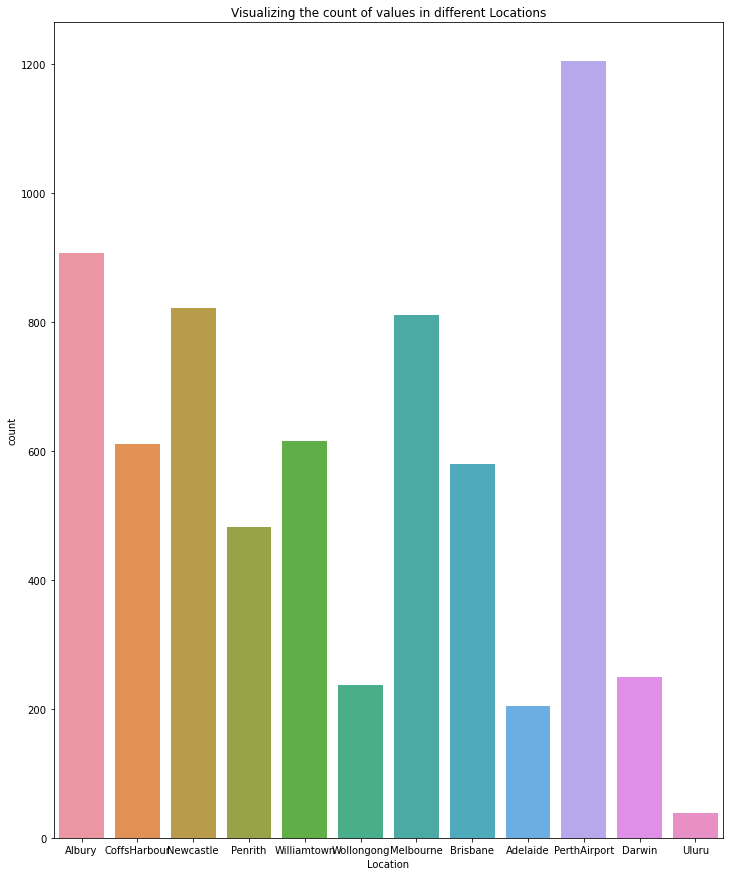

In [18]:
print(df['Location'].value_counts())
plt.figure(figsize=(12,15))
sns.countplot(x='Location',data=df)
plt.title("Visualizing the count of values in different Locations")
plt.show()

                            **Observations**
                            
**Percentage preferance of the location of the weather station for PerthAirport is 17.80% which is counted as the highest and preferable amongst all the locations**

Second most preferable Locations

**Percentage of the location of the weather station Albury 13.41%**

**Percentage of the location of the weather station Newcastle 12.15%**

**Percentage of the location of the weather station Melbourne 11.99%**

Third most preferable Locations

**Percentage of the location of the weather station Williamtown 9.09%**

**Percentage of the location of the weather station CoffsHarbour 9.03%**

**Percentage of the location of the weather station Brisbane 8.56%**

**Percentage of the location of the weather station Penrith 7.12%**


Least preferable Locations are

**Percentage of the location of the weather station Darwin 3.69%**

**Percentage of the location of the weather station Wollongong 3.50%**

**Percentage of the location of the weather station Adelaide 3.03%**

**Percentage of the location of the weather station Uluru 0.57%**

E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


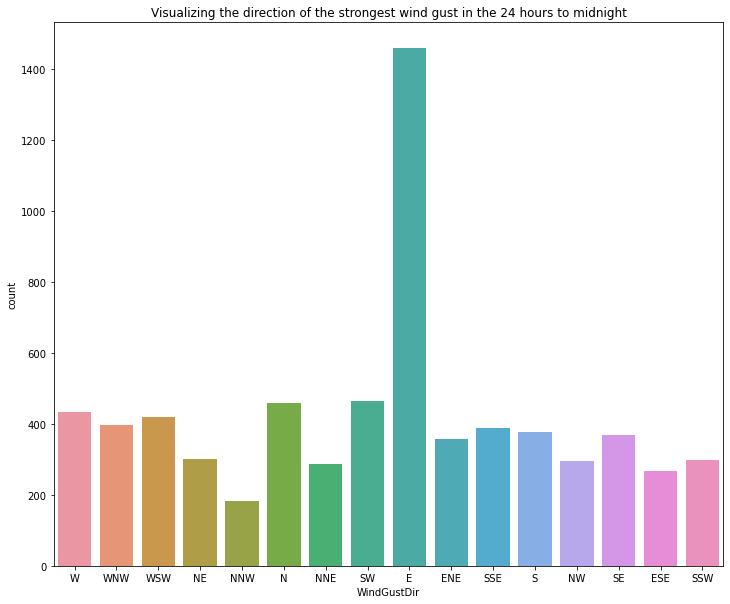

In [19]:
print(df['WindGustDir'].value_counts())
plt.figure(figsize=(12,10))
sns.countplot(x='WindGustDir',data=df)
plt.title("Visualizing the direction of the strongest wind gust in the 24 hours to midnight")
plt.show()

                               **Observations**
                               
**East has been Visualized as the most strongest direction of the wind gust in the 24 hours to midnight as 21.59% of winds are flowing from this direction**

**We can visualize a huge gap after East direction to other directions**

**Least count of Winds has been visualized from North North West**

N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


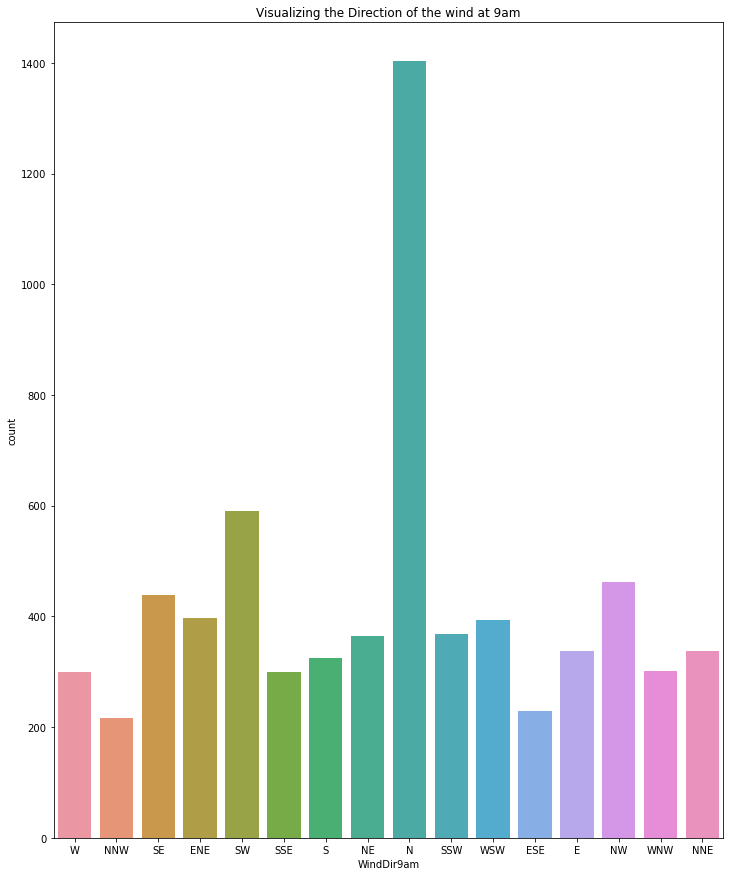

In [20]:
print(df['WindDir9am'].value_counts())
plt.figure(figsize=(12,15))
sns.countplot(x='WindDir9am',data=df)
plt.title("Visualizing the Direction of the wind at 9am")
plt.show()

**Winds Direction at 9am is coming maximum from North Directions around 21.7% of the winds has been visualized**


SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


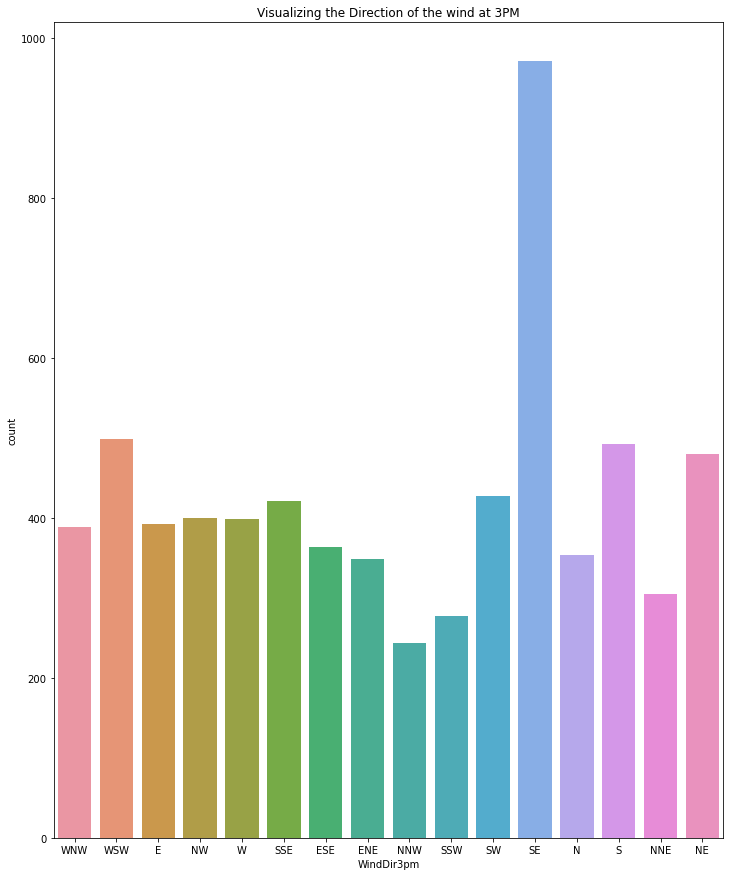

In [21]:
print(df['WindDir3pm'].value_counts())
plt.figure(figsize=(12,15))
sns.countplot(x='WindDir3pm',data=df)
plt.title("Visualizing the Direction of the wind at 3PM")
plt.show()

**In the afternoon around second base notice time winds are shifting their directions from north to South East**

**We can also visualize that apart from South East all other directions are almost showing the flow of winds in equal proportions** 

No     5190
Yes    1572
Name: RainToday, dtype: int64


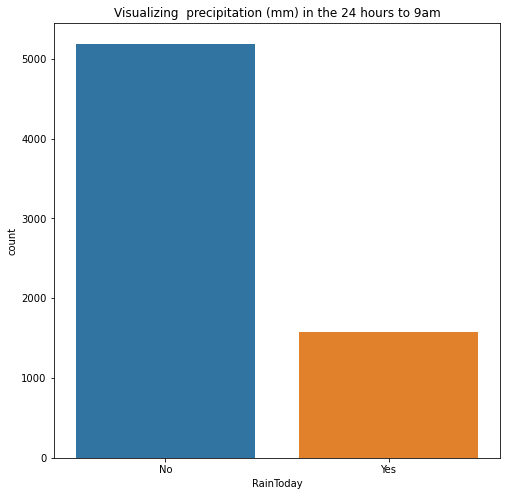

In [22]:
print(df['RainToday'].value_counts())
plt.figure(figsize=(8,8))
sns.countplot(x='RainToday',data=df)
plt.title("Visualizing  precipitation (mm) in the 24 hours to 9am")
plt.show()

                                         **Observations**
                                         
**We count visualize more No are present and we can understand that their are less chaces of rain for present day prediction of rain as compared to chances of having Rain**

**Chances of having rain on day-23.38%**

**Chances of not having rain on day - 76.75%**

No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


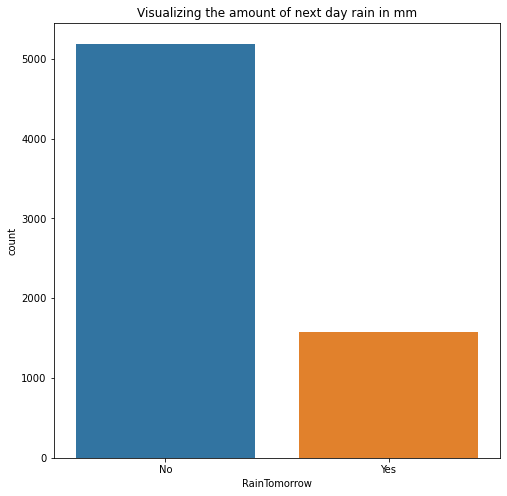

In [23]:
print(df['RainTomorrow'].value_counts())
plt.figure(figsize=(8,8))
sns.countplot(x='RainTomorrow',data=df)
plt.title("Visualizing the amount of next day rain in mm")
plt.show()



**Their are 76.75% of chances for not having rains on very next day of date we are predicting the rain** 

**We have only 23.38% percent of Chances of having the rain on the very next day of date we are predicting the rain**

**As we have noticed the pattern here both columns has shown same counts and logically they may show Multi-collinearity ,we will check the same and will take the decision for keeping/deleting any of column**

2011    1133
2010    1078
2014     959
2009     950
2012     876
2015     580
2013     543
2016     366
2017     215
2008      62
Name: Year, dtype: int64


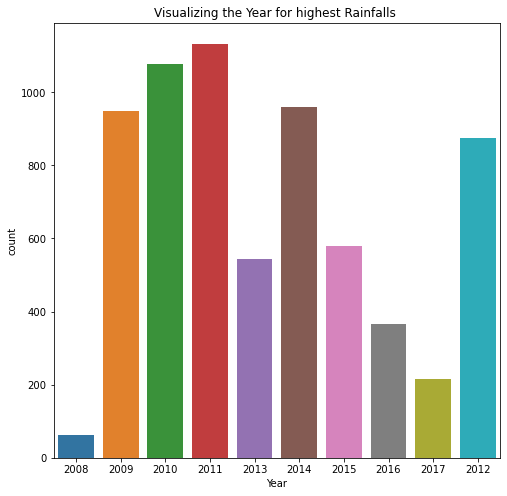

In [24]:
print(df['Year'].value_counts())
plt.figure(figsize=(8,8))
sns.countplot(x='Year',data=df)
plt.title("Visualizing the Year for highest Rainfalls ")
plt.show()

                          **Observations**
                          
**Highest Rainfall years in 10 years**         


2011

2010    
2014     
2009    
2012     

**Out of total rainnfall these five years has inculcate with 74.32% of rainfall**

**Mid Rainfall years in 10 years**

2015    
2013     
2016     

**Around 22.5% of rainfall has been noticed in these 3 years**


**Lowest Rainfall years in 10 years**

2017     
2008    

**Around 4.12% on rainfall,which is least amongst all has been noticed in these two years combined**

06    673
05    646
07    614
03    606
08    589
01    569
12    555
10    529
09    519
11    503
04    480
02    479
Name: Month, dtype: int64


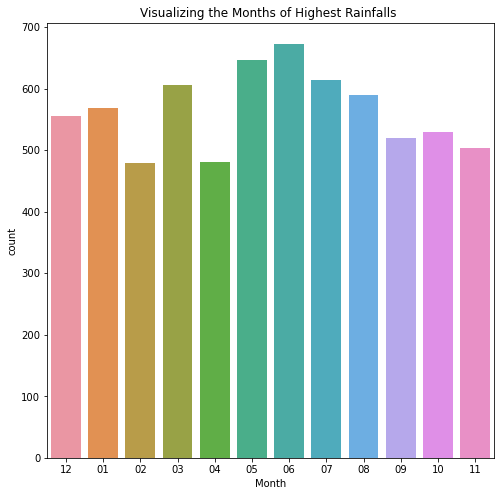

In [25]:
print(df['Month'].value_counts())
plt.figure(figsize=(8,8))
sns.countplot(x='Month',data=df)
plt.title("Visualizing the Months of Highest Rainfalls ")
plt.show()

**Highest Rainfall months**

MONTH----------------%of Rainfall

**6-------------------10%**

**5--------------------9.61%**

**7-------------------9.13%**

**3--------------------9%**

**Total=============37.84% of Rainfall**


**Lowest Rainfall Months**

**04-------------------7.14%**

**02-------------------7.12%**

10    224
23    224
20    224
25    224
24    224
21    224
22    224
07    223
08    223
09    223
11    223
12    223
18    222
13    222
19    222
06    222
28    221
01    221
16    221
17    221
02    221
15    221
14    221
05    221
04    221
03    221
26    220
27    220
29    206
30    202
31    133
Name: Day, dtype: int64


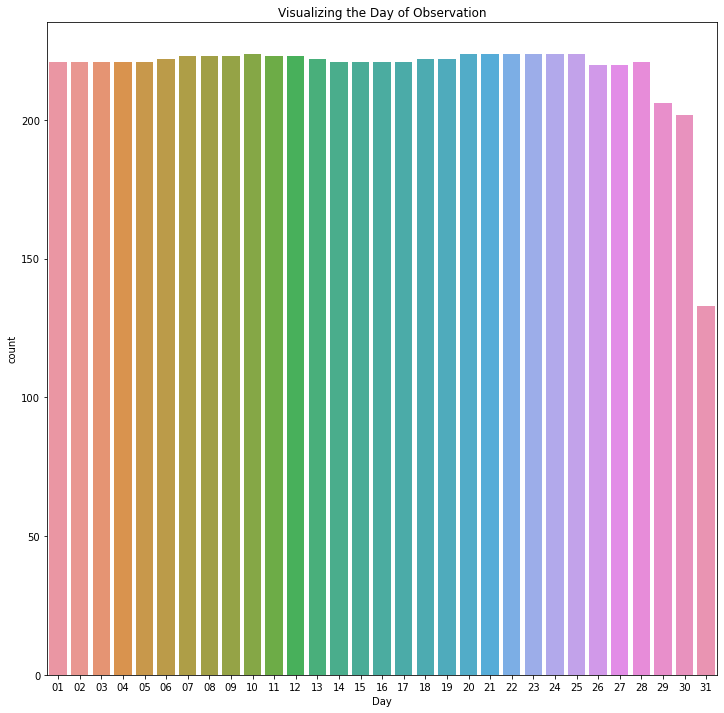

In [26]:
print(df['Day'].value_counts())
plt.figure(figsize=(12,12))
sns.countplot(x='Day',data=df)
plt.title("Visualizing the Day of Observation")
plt.show()

**We can visulalize that except last 3 days on any month has shown a very less trend of rainfall where in almost all the days of months you can visualize equal count of rainfall**

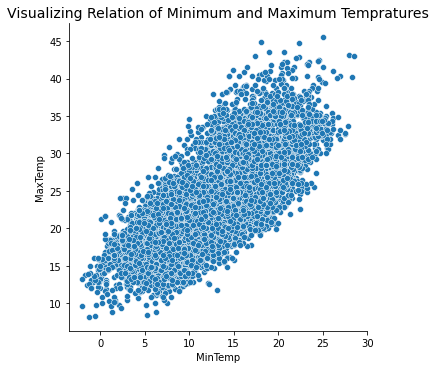

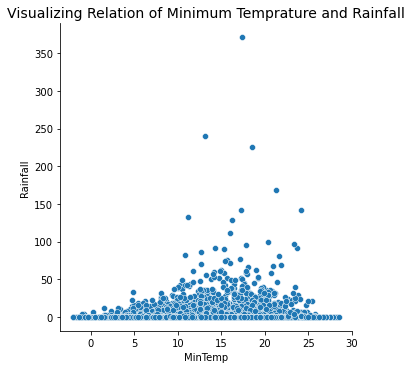

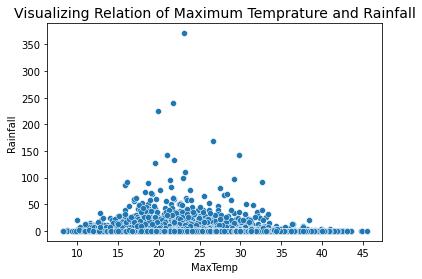

In [86]:
sns.relplot(x='MinTemp',y='MaxTemp',data=df)
plt.title("Visualizing Relation of Minimum and Maximum Tempratures",fontsize=14)
plt.show()
sns.relplot(x='MinTemp',y='Rainfall',data=df)
plt.title("Visualizing Relation of Minimum Temprature and Rainfall",fontsize=14)
plt.show()
sns.scatterplot(x='MaxTemp',y='Rainfall',data=df)
plt.title("Visualizing Relation of Maximum Temprature and Rainfall",fontsize=14)
plt.show()

                                  **Observations**
                                  
**Min and Maximum Temprature are showing excellent Correlation their are chances they might show Multi-collinearity**

**Heavy Rainfall has been observed when Minimum temprature is between 10-24**

**Heavy Rainfall has been observed when temprature is between 15-25**

**Temprature increase and Decrease at mentioned range has a direct correlation with Rainfall**

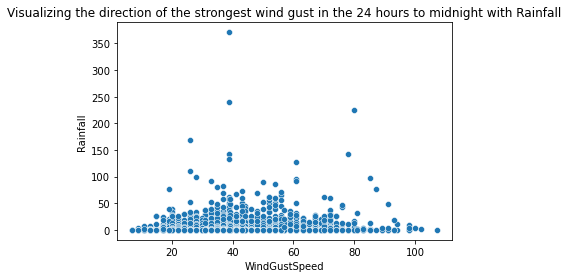

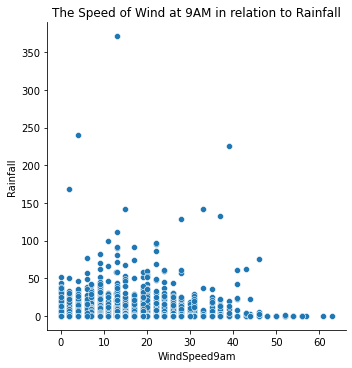

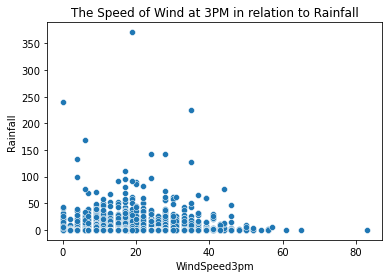

In [88]:
sns.scatterplot(y='Rainfall',x='WindGustSpeed',data=df)
plt.title("Visualizing the direction of the strongest wind gust in the 24 hours to midnight with Rainfall",fontsize=12)
plt.show()

sns.relplot(x='WindSpeed9am',y='Rainfall',data=df)
plt.title("The Speed of Wind at 9AM in relation to Rainfall",fontsize=12)
plt.show()
sns.scatterplot(x='WindSpeed3pm',y='Rainfall',data=df)
plt.title("The Speed of Wind at 3PM in relation to Rainfall",fontsize=12)
plt.show()

                                **Observations**
                                
**When direction of strongest wind in ranging between 38-41 & 58-61 we can visualize the heavy Rainfall**

**Wind speed in the Morning and in Afternoon has shown the same treand ,when speed is between 10-22 both have shown a excellent amount of Rainfall and post this range we can see the level of rainfall is decreasing and is very miniscule**


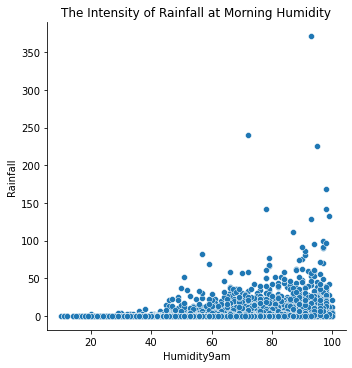

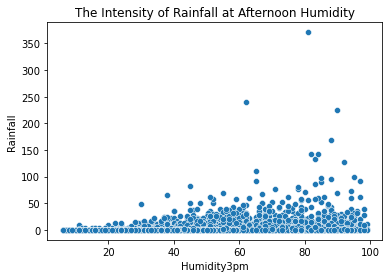

In [89]:
sns.relplot(x='Humidity9am',y='Rainfall',data=df)
plt.title("The Intensity of Rainfall at Morning Humidity",fontsize=12)

plt.show()

sns.scatterplot(x='Humidity3pm',y='Rainfall',data=df)
plt.title("The Intensity of Rainfall at Afternoon Humidity",fontsize=12)

plt.show()

                             **Observations**
                             
**When the Humidity of morning crosses its range of 60,we can visualizea heavy amount of Rainfall and as when humidity increases level of rainfall also increases**

**Humidity has been visualized as the diirect correlated column with rainfall as we can clearly visualize in both Morning and Afternoon with a rise in Humidity their is a rise in Rainfall** 

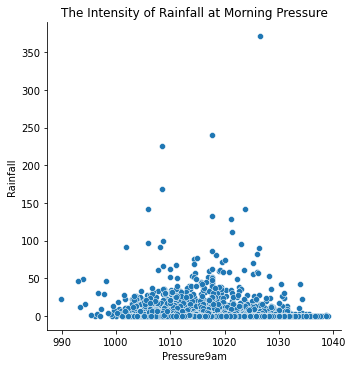

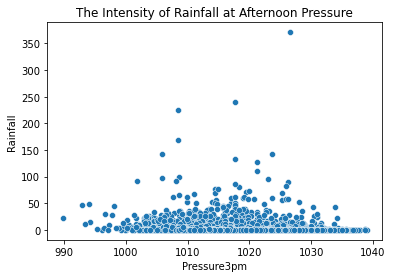

In [90]:
sns.relplot(x='Pressure9am',y='Rainfall',data=df)
plt.title("The Intensity of Rainfall at Morning Pressure",fontsize=12)
plt.show()
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df)
plt.title("The Intensity of Rainfall at Afternoon Pressure",fontsize=12)
plt.show()

                              **Observations**
                              
**If pressure in morning is ranging between 1010-1022 we can visualize more rainfall as compared to pressure in afternoon for same range**

**In the afternoon if pressure comes in range of 1009-1020 we can visualize a heavy rainfall and maximum rainfall has also been observed in range 1028-1029**

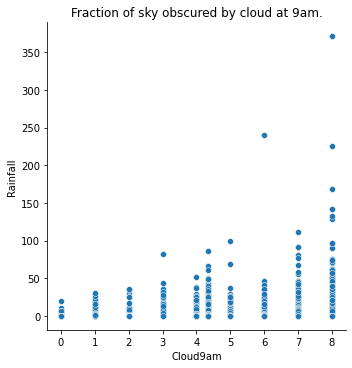

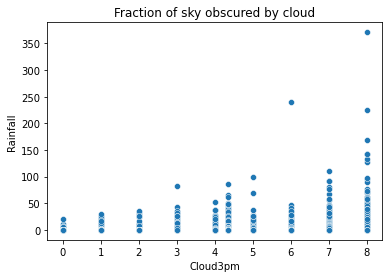

In [91]:
sns.relplot(x='Cloud9am',y='Rainfall',data=df)
plt.title("Fraction of sky obscured by cloud at 9am.",fontsize=12)
plt.show()
sns.scatterplot(x='Cloud3pm',y='Rainfall',data=df)
plt.title("Fraction of sky obscured by cloud",fontsize=12)
plt.show()

                        **Observations**
                        
**We can visualize the same trend in Fraction of sky obscured by cloud where with increase in the fraction of clouds considering both times,we can visualize their is a heavy Rainfall**

**Logically when maximum fraction has been covered by clouds it tends to increase the intensity of Rain**

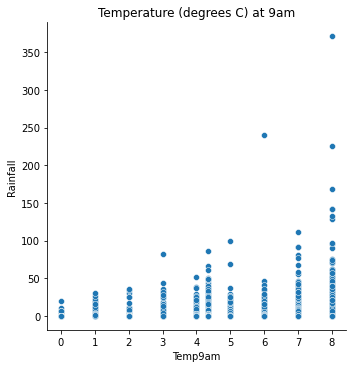

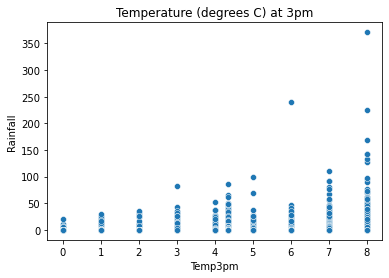

In [92]:
sns.relplot(x='Temp9am',y='Rainfall',data=df)
plt.title("Temperature (degrees C) at 9am",fontsize=12)
plt.show()
sns.scatterplot(x='Temp3pm',y='Rainfall',data=df)
plt.title("Temperature (degrees C) at 3pm",fontsize=12)
plt.show()

                                **Observations**
                                
**We can visualize a direct correlation with a direct increase in temprature we can visaulize a direct rise in rainfall**

**If temprature in both time shifts increases we can expect heavy amount of Rainfall at both times**

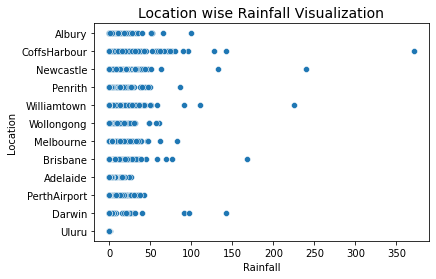

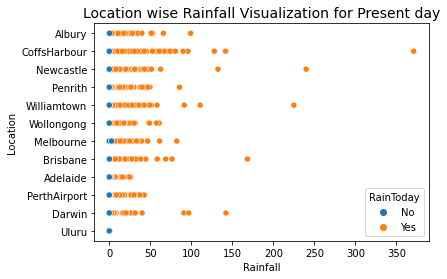

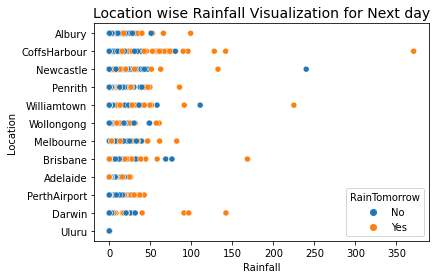

In [93]:
sns.scatterplot(x='Rainfall',y='Location',data=df)
plt.title("Location wise Rainfall Visualization",fontsize=14)
plt.show()

sns.scatterplot(x='Rainfall',y='Location',hue='RainToday',data=df)
plt.title("Location wise Rainfall Visualization for Present day",fontsize=14)
plt.show()
sns.scatterplot(x='Rainfall',y='Location',hue='RainTomorrow',data=df)
plt.title("Location wise Rainfall Visualization for Next day",fontsize=14)
plt.show()

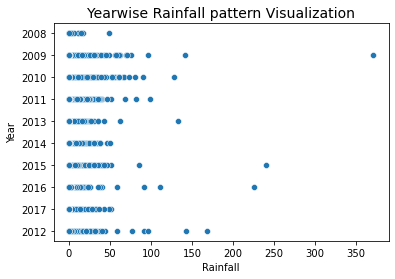

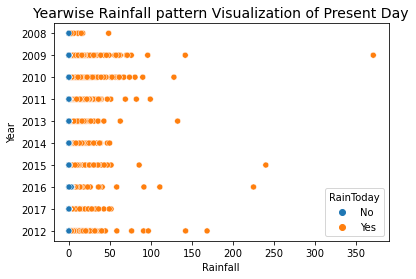

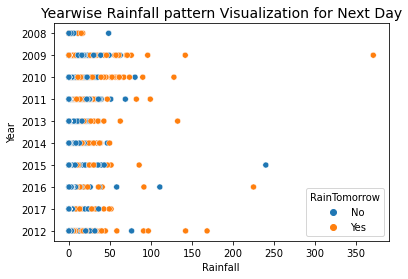

In [96]:
sns.scatterplot(x='Rainfall',y='Year',data=df)
plt.title("Yearwise Rainfall pattern Visualization",fontsize=14)
plt.show()

sns.scatterplot(x='Rainfall',y='Year',hue='RainToday',data=df)
plt.title("Yearwise Rainfall pattern Visualization of Present Day",fontsize=14)
plt.show()
sns.scatterplot(x='Rainfall',y='Year',hue='RainTomorrow',data=df)
plt.title("Yearwise Rainfall pattern Visualization for Next Day",fontsize=14)

plt.show()

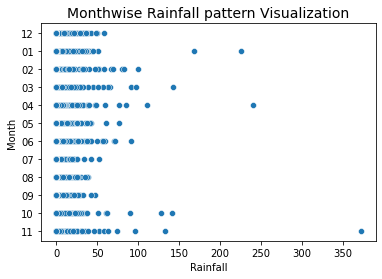

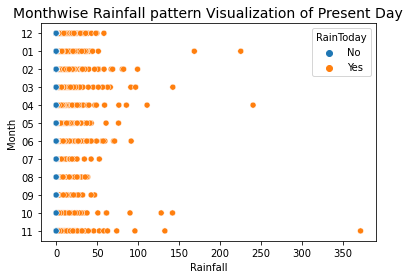

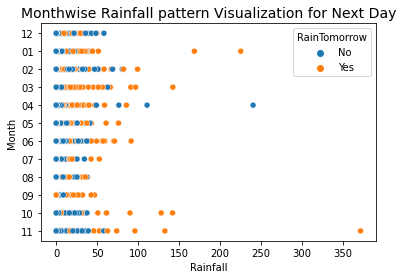

In [97]:
sns.scatterplot(x='Rainfall',y='Month',data=df)
plt.title("Monthwise Rainfall pattern Visualization",fontsize=14)
plt.show()
sns.scatterplot(x='Rainfall',y='Month',hue='RainToday',data=df)
plt.title("Monthwise Rainfall pattern Visualization of Present Day",fontsize=14)
plt.show()
sns.scatterplot(x='Rainfall',y='Month',hue='RainTomorrow',data=df)
plt.title("Monthwise Rainfall pattern Visualization for Next Day",fontsize=14)
plt.show()

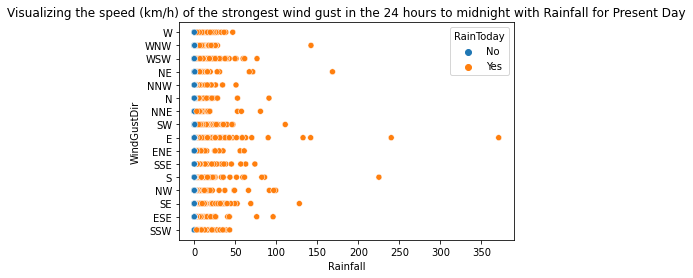

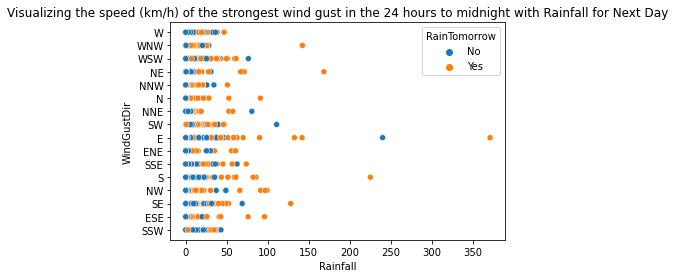

In [99]:
sns.scatterplot(x='Rainfall',y='WindGustDir',hue='RainToday',data=df)
plt.title("Visualizing the speed (km/h) of the strongest wind gust in the 24 hours to midnight with Rainfall for Present Day")
plt.show()
sns.scatterplot(x='Rainfall',y='WindGustDir',hue='RainTomorrow',data=df)
plt.title("Visualizing the speed (km/h) of the strongest wind gust in the 24 hours to midnight with Rainfall for Next Day")
plt.show()

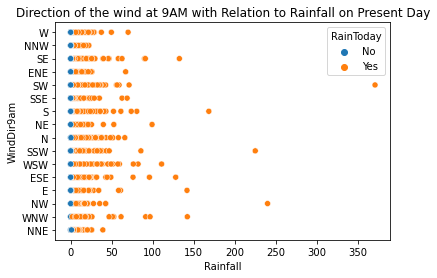

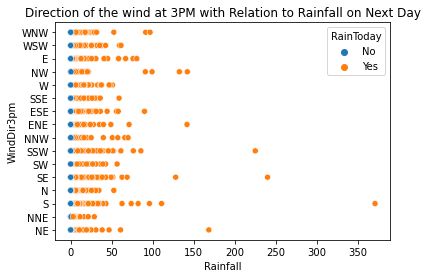

In [101]:
sns.scatterplot(x='Rainfall',y='WindDir9am',hue='RainToday',data=df)
plt.title("Direction of the wind at 9AM with Relation to Rainfall on Present Day")
plt.show()
sns.scatterplot(x='Rainfall',y='WindDir3pm',hue='RainToday',data=df)
plt.title("Direction of the wind at 3PM with Relation to Rainfall on Next Day")
plt.show()

**Checking the distribtion of Data for Columns**


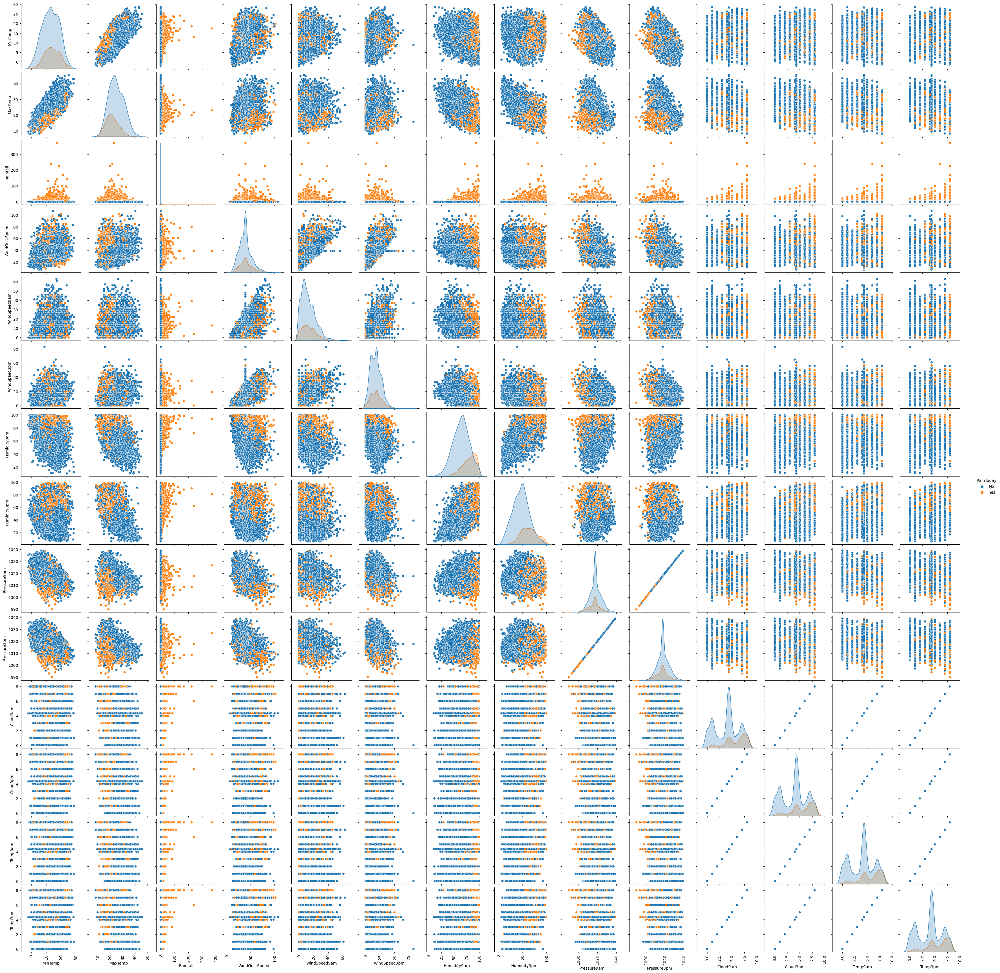

In [29]:
plt.style.use('default')
g = sns.pairplot(df, hue='RainToday', diag_kind='kde')
for ax in g.axes.flat:
    ax.tick_params("x", labelrotation=90)
plt.show()

# Multi-Collinearity

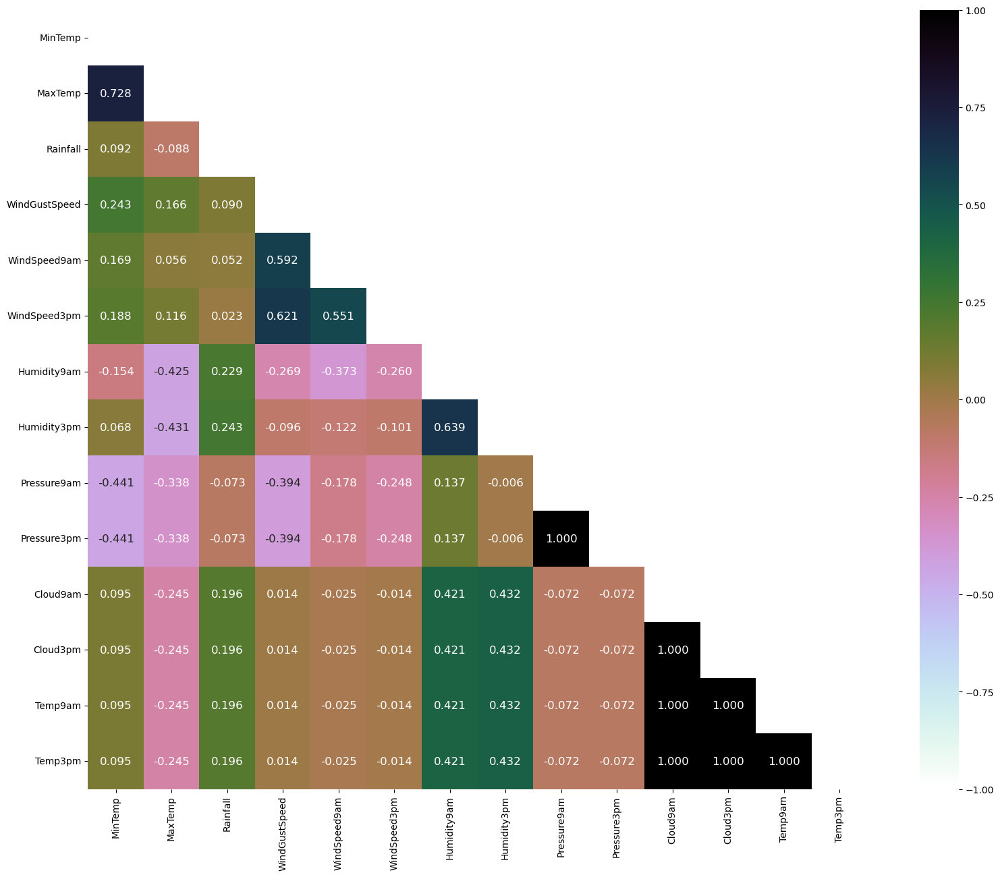

In [33]:
upper_triangle = np.triu(df.corr())
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':12}, cmap="cubehelix_r", mask=upper_triangle)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

                                         **Observations**
                                         
**We have pointed out and expecting the Multi-Collinearity in features which are showing the same count of Results for both noticable time shifts**

**Cloud 9am is showing Multi-Collinearity with Temp3pm,Temp9am,Temp3pm**

**We need to check Correlation for same with our target Variable for decisioning of keeping/deleting these features**

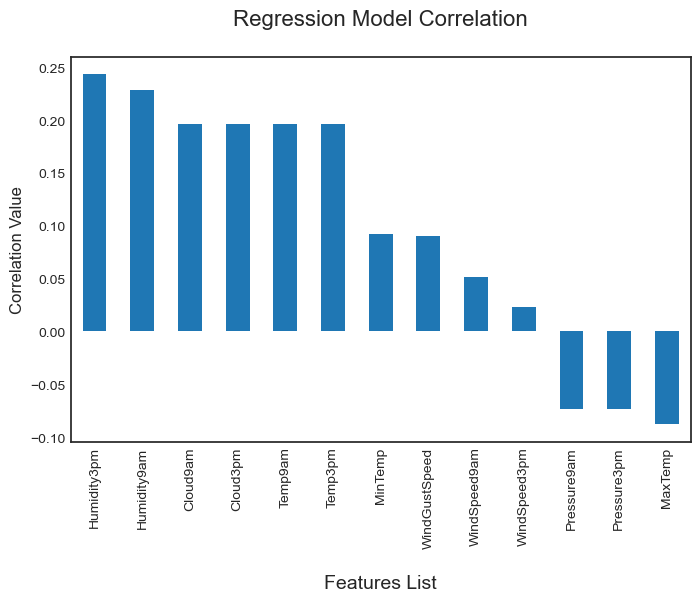

In [36]:
plt.style.use('seaborn-white')
df_corr = df.corr()
plt.figure(figsize=(8,5))
df_corr['Rainfall'].sort_values(ascending=False).drop('Rainfall').plot.bar()
plt.title("Regression Model Correlation\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

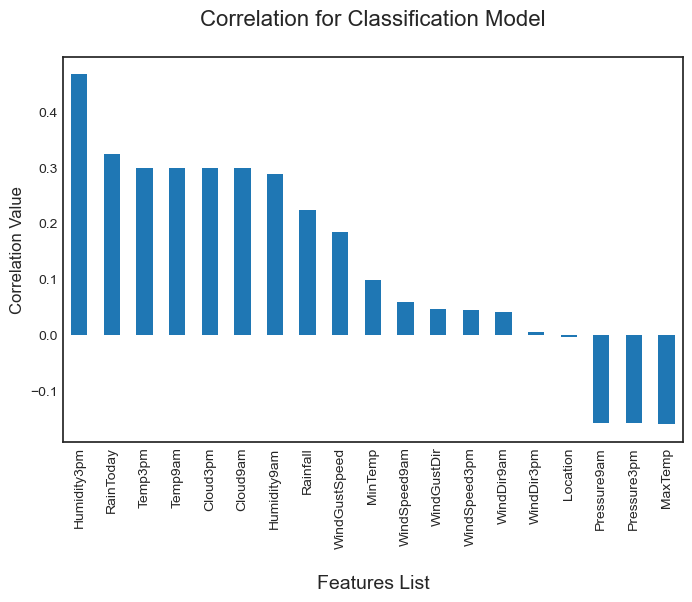

In [42]:
plt.style.use('seaborn-white')
df_corr = df.corr()
plt.figure(figsize=(8,5))
df_corr['RainTomorrow'].sort_values(ascending=False).drop('RainTomorrow').plot.bar()
plt.title("Correlation for Classification Model\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

                                 **Observations**

**We have visualized that for both our Models Pressure 9am,Pressure3Pm and MaxTemprature are negatively correlated columns**

**We are going to drop them**

In [169]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6762 non-null   float64
 2   MaxTemp        6762 non-null   float64
 3   Rainfall       6762 non-null   float64
 4   WindGustDir    6762 non-null   object 
 5   WindGustSpeed  6762 non-null   float64
 6   WindDir9am     6762 non-null   object 
 7   WindDir3pm     6762 non-null   object 
 8   WindSpeed9am   6762 non-null   float64
 9   WindSpeed3pm   6762 non-null   float64
 10  Humidity9am    6762 non-null   float64
 11  Humidity3pm    6762 non-null   float64
 12  Pressure9am    6762 non-null   float64
 13  Pressure3pm    6762 non-null   float64
 14  Cloud9am       6762 non-null   float64
 15  Cloud3pm       6762 non-null   float64
 16  Temp9am        6762 non-null   float64
 17  Temp3pm        6762 non-null   float64
 18  RainToda

# Encoding

In [207]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

In [208]:
le = LabelEncoder()
le.fit(df["RainTomorrow"])
le.classes_
pd.Series(le.transform(df["RainTomorrow"])).head()

0    0
1    0
2    0
3    0
4    0
dtype: int32

In [209]:
df["RainTomorrow"] = le.fit_transform(df["RainTomorrow"])
df.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,...,1007.7,8.000000,8.000000,8.000000,8.000000,No,0,2008,12,01
1,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,...,1010.6,4.336806,4.336806,4.336806,4.336806,No,0,2008,12,02
2,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,...,1007.6,4.336806,4.336806,4.336806,4.336806,No,0,2008,12,03
3,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,...,1017.6,4.336806,4.336806,4.336806,4.336806,No,0,2008,12,04
4,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,...,1010.8,7.000000,7.000000,7.000000,7.000000,No,0,2008,12,05


**Applying Ordinal Encoder to Object Data type columns**

In [210]:
oe = OrdinalEncoder()
def ordinal_encode(df, column):
    df[column] = oe.fit_transform(df[column])
    return df

df=ordinal_encode(df, ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','Year','Month','Day'])
df.head(2)

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.9,0.6,13.0,44.0,13.0,14.0,20.0,24.0,...,1007.7,8.000000,8.000000,8.000000,8.000000,0.0,0,0.0,11.0,0.0
1,1.0,7.4,25.1,0.0,14.0,44.0,6.0,15.0,4.0,22.0,...,1010.6,4.336806,4.336806,4.336806,4.336806,0.0,0,0.0,11.0,1.0


**Visualizing Outliers**

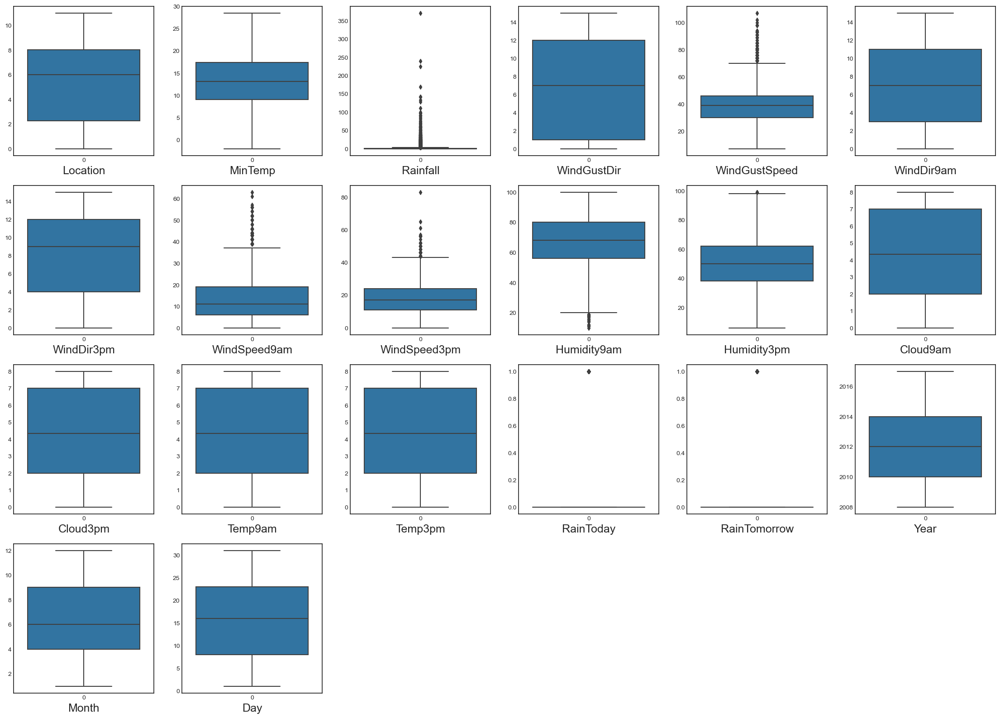

In [49]:
plt.figure(figsize=(28,30))
plotnumber=1
for column in df:
    if plotnumber<=36:
        plt.subplot(6,6,plotnumber)
        ax=sns.boxplot(data=df[column])
        plt.xlabel(column,fontsize=18)
        
    plotnumber+=1
    
plt.show()   

**Outliers in Rainfall,Wind_Gust_speed,wind_speed9am,WindSpeed3pm,RainToday and rainTomorrow has been Visualized**

**Humidity9am outliers has been visaulized on the lower side**

**Removing Outliers**

In [211]:
z = np.abs(zscore(df))
threshold = 3
df1 = df[(z<3).all(axis = 1)]

print ("Shape of the dataframe before removing outliers: ", df.shape)
print ("Shape of the dataframe after removing outliers: ", df1.shape)
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df1.shape[0])/df.shape[0]*100)

df=df1.copy()

Shape of the dataframe before removing outliers:  (6762, 23)
Shape of the dataframe after removing outliers:  (6480, 23)
Percentage of data loss post outlier removal:  4.17036379769299


**Percentage Loss in acceptable**

**Dropping the negatively Correlated Columns**

In [212]:
df.drop(columns=['Pressure9am'],inplace=True)
df.drop(columns=['Pressure3pm'],inplace=True)
df.drop(columns=['MaxTemp'],inplace=True)

**Checking the Shape of Dataset**

In [213]:
df.shape

(6480, 20)

**Checking Columns post Encoding**

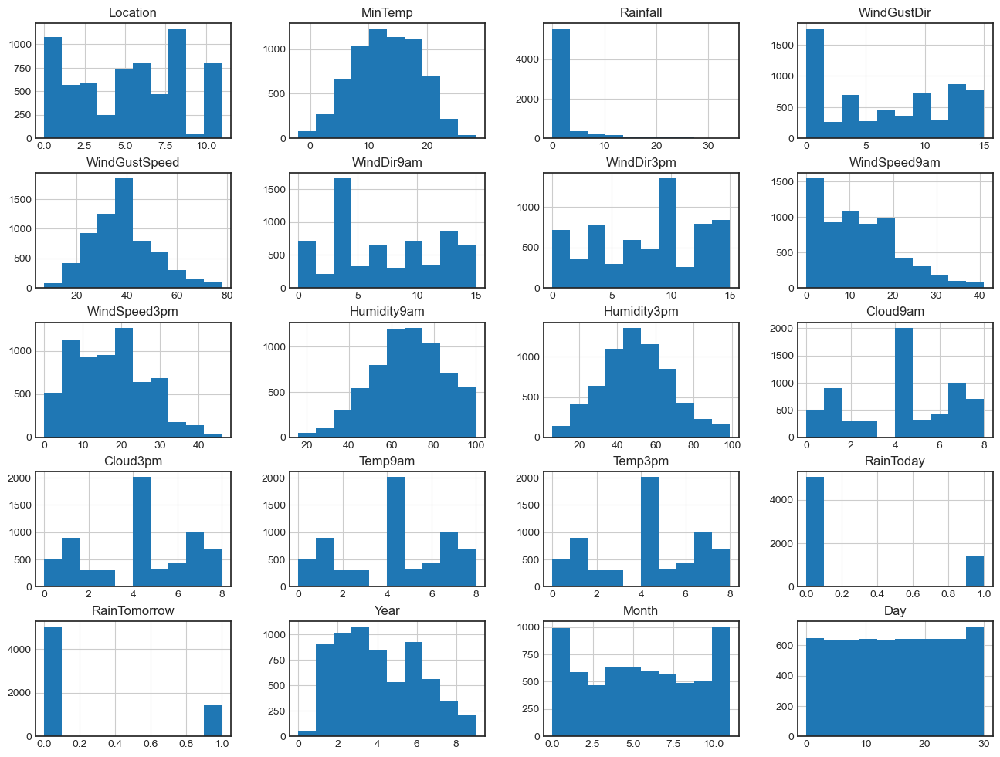

In [214]:
df.hist(figsize=(16,12))
plt.show()

**Skewness Check**

In [215]:
df.skew()

Location        -0.001068
MinTemp         -0.078460
Rainfall         3.520908
WindGustDir      0.098730
WindGustSpeed    0.482237
WindDir9am       0.211125
WindDir3pm      -0.129490
WindSpeed9am     0.679050
WindSpeed3pm     0.340979
Humidity9am     -0.228285
Humidity3pm      0.155519
Cloud9am        -0.203980
Cloud3pm        -0.203980
Temp9am         -0.203980
Temp3pm         -0.203980
RainToday        1.338765
RainTomorrow     1.329117
Year             0.343339
Month            0.029730
Day              0.004131
dtype: float64

**Except Rainfall every column is in threshold limit of +-5 for Skewness**

**We will use Log Transformation to controll the same**

In [216]:
float_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'float64':
        float_datatype.append(x)
print(f"Float Data Type Columns are: ", float_datatype)



Float Data Type Columns are:  ['Location', 'MinTemp', 'Rainfall', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'Year', 'Month', 'Day']


**Applying Log Transformation**

In [217]:
for col in float_datatype:
    if df.skew().loc[col]>0.55:
        df[col]=np.log1p(df[col])


In [218]:
df.skew()

Location        -0.001068
MinTemp         -0.078460
Rainfall         1.738900
WindGustDir      0.098730
WindGustSpeed    0.482237
WindDir9am       0.211125
WindDir3pm      -0.129490
WindSpeed9am    -1.066246
WindSpeed3pm     0.340979
Humidity9am     -0.228285
Humidity3pm      0.155519
Cloud9am        -0.203980
Cloud3pm        -0.203980
Temp9am         -0.203980
Temp3pm         -0.203980
RainToday        1.338765
RainTomorrow     1.329117
Year             0.343339
Month            0.029730
Day              0.004131
dtype: float64

**Skewness is in controll,Lets visualize the Same**

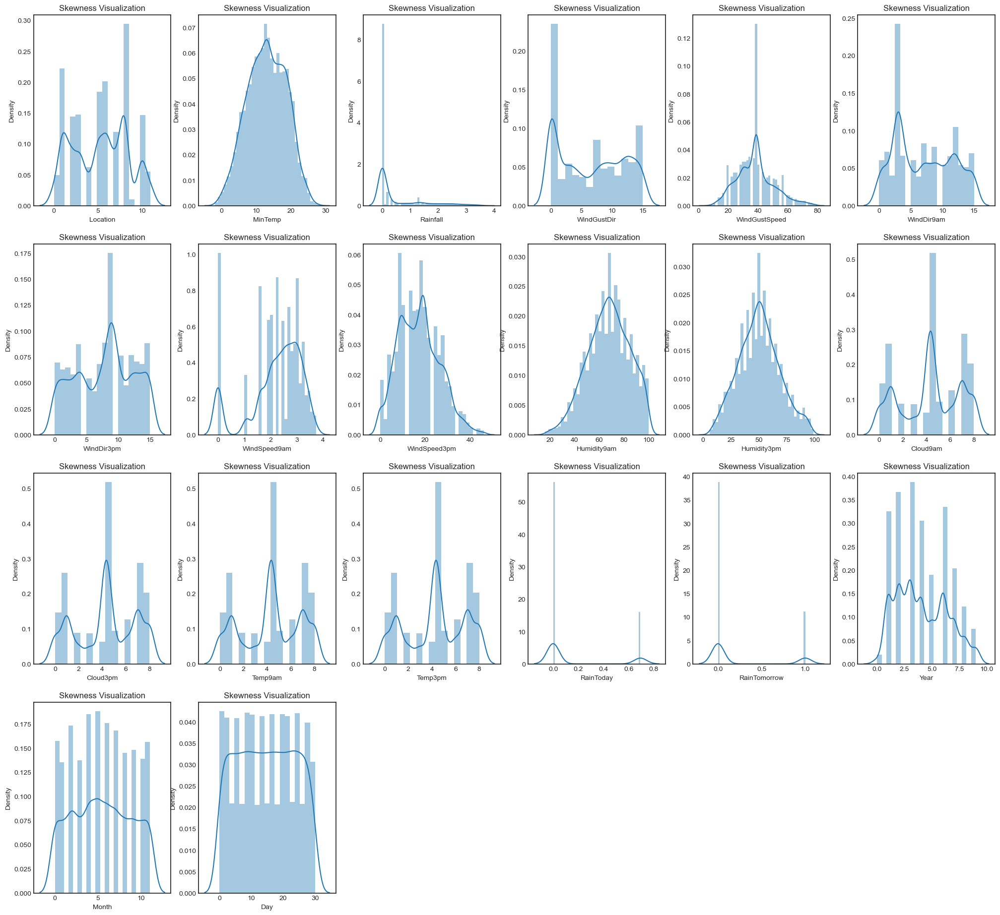

In [219]:
plt.figure(figsize=(25,35))
plotnumber=1
for column in df:
    if plotnumber<=36:
        plt.subplot(6,6,plotnumber)
        ax=sns.distplot(df[column])
        plt.title('Skewness Visualization')
    plotnumber+=1
    
plt.show() 

**Skewness has been Visualized in complete controll**

**Checking Class Imbalance in our target variable for Classification Model for that we are seprating features and Label**

In [220]:
x = df.drop('RainTomorrow', axis=1)
y = df['RainTomorrow']

In [221]:
y.value_counts()

0    5033
1    1447
Name: RainTomorrow, dtype: int64

In [222]:
#Importing Library
from imblearn.over_sampling import SMOTE

In [223]:
over = SMOTE()
x, y = over.fit_resample(x, y)

y.value_counts()

0    5033
1    5033
Name: RainTomorrow, dtype: int64

**Class Imbalance has been resolved using SMOTE**

In [224]:
from sklearn.preprocessing import StandardScaler
##Scaling data using Standard Scaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,MinTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.454756,0.010191,-0.225080,1.231853,0.362763,1.327430,1.415290,0.821391,0.729316,0.009381,-1.753870,1.340491,1.340491,1.340491,1.340491,-0.698366,-1.826452,1.744729,-1.692031
1,-1.454756,-1.116869,-0.722723,1.428528,0.362763,-0.256089,1.648919,-0.679959,0.510820,-1.616034,-1.598365,-0.192360,-0.192360,-0.192360,-0.192360,-0.698366,-1.826452,1.744729,-1.577108
2,-1.454756,-0.083731,-0.722723,1.625203,0.521106,1.327430,1.648919,0.770348,0.947812,-1.977238,-1.339188,-0.192360,-0.192360,-0.192360,-0.192360,-0.698366,-1.826452,1.744729,-1.462186
3,-1.454756,-0.778751,-0.722723,-0.538222,-1.220662,0.422562,-1.855506,0.235935,-0.909405,-1.555834,-2.064882,-0.192360,-0.192360,-0.192360,-0.192360,-0.698366,-1.826452,1.744729,-1.347263
4,-1.454756,0.780349,0.011185,1.231853,0.125249,-1.387174,-0.220108,-0.188253,0.292324,0.671587,-1.183683,0.922044,0.922044,0.922044,0.922044,-0.698366,-1.826452,1.744729,-1.232340


**Importing necessary Libraries for Classification Model Building**

In [233]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

**Finding maximum Accuracy**

In [229]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    acc_score = (accuracy_score(y_test, pred))*100
    
    if acc_score>maxAccu:
        maxAccu=acc_score
        maxRS=i

print("Best accuracy score is", maxAccu,"on Random State", maxRS)

Best accuracy score is 79.02264600715138 on Random State 373


**Train_Test_Split**

In [230]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=373)

**Defining a function to print Accuracy_score,CV_Score,printing Classification_report and finally the result by deducting Accuracy score from CV score to choose the least difference model**

In [231]:
# Classification Model Function

def classify(model, x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=431)
    
    # Training the model
    model.fit(x_train, y_train)
    
    # Predicting Y_test
    pred = model.predict(x_test)
    
    # Accuracy Score
    acc_score = (accuracy_score(y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Classification Report
    class_report = classification_report(y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, x, y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

**Logistic Regression**

In [234]:
model=LogisticRegression()
classify(model, x, y)

Accuracy Score: 77.67183154549066

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.80      0.79      1315
           1       0.78      0.75      0.76      1202

    accuracy                           0.78      2517
   macro avg       0.78      0.78      0.78      2517
weighted avg       0.78      0.78      0.78      2517

Cross Validation Score: 69.95845771107463

Accuracy Score - Cross Validation Score is 7.713373834416032


**Decision Tree Classifier**

In [236]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, x, y)

Accuracy Score: 84.38617401668654

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.84      0.85      1315
           1       0.83      0.84      0.84      1202

    accuracy                           0.84      2517
   macro avg       0.84      0.84      0.84      2517
weighted avg       0.84      0.84      0.84      2517

Cross Validation Score: 60.96781052256658

Accuracy Score - Cross Validation Score is 23.41836349411996


**Random Forest Classifier**

In [237]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, x, y)

Accuracy Score: 90.2264600715137

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91      1315
           1       0.91      0.88      0.90      1202

    accuracy                           0.90      2517
   macro avg       0.90      0.90      0.90      2517
weighted avg       0.90      0.90      0.90      2517

Cross Validation Score: 69.65071129021834

Accuracy Score - Cross Validation Score is 20.57574878129536


**KNeighbors Classifier**

In [238]:
# KNeighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, x, y)

Accuracy Score: 81.28724672228844

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.76      0.81      1315
           1       0.77      0.87      0.82      1202

    accuracy                           0.81      2517
   macro avg       0.82      0.82      0.81      2517
weighted avg       0.82      0.81      0.81      2517

Cross Validation Score: 66.25268426528459

Accuracy Score - Cross Validation Score is 15.034562457003858


**XGB Classifier**

In [239]:
model=xgb.XGBClassifier(verbosity=0)
classify(model, x, y)

Accuracy Score: 90.06754072308304

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91      1315
           1       0.91      0.88      0.89      1202

    accuracy                           0.90      2517
   macro avg       0.90      0.90      0.90      2517
weighted avg       0.90      0.90      0.90      2517

Cross Validation Score: 55.186841636611284

Accuracy Score - Cross Validation Score is 34.88069908647176


**Hyperparameter Tuning on Final Model Logistic Regression**

In [ ]:
LogisticRegression()

In [240]:
fmod_param = {'penalty' : ['l1', 'l2', 'elasticnet'],
              'max_iter' : [200, 300, 400],
              'class_weight':['dict','balanced'],
              'C' : [2.0,3.0,4.0,5.0]}

In [241]:
GSCV = GridSearchCV(LogisticRegression(), fmod_param, cv=5)

In [242]:
GSCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [2.0, 3.0, 4.0, 5.0],
                         'class_weight': ['dict', 'balanced'],
                         'max_iter': [200, 300, 400],
                         'penalty': ['l1', 'l2', 'elasticnet']})

In [243]:
GSCV.best_params_

{'C': 2.0, 'class_weight': 'dict', 'max_iter': 200, 'penalty': 'l2'}

In [245]:
Final_Model = LogisticRegression(C=2.0, class_weight='dict', max_iter=200,penalty='l2')
Classifier = Final_Model.fit(x_train, y_train)
fmod_pred = Final_Model.predict(x_test)
fmod_acc = (accuracy_score(y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

Accuracy score for the Best Model is: 78.98291617004371


**ROC Curve**

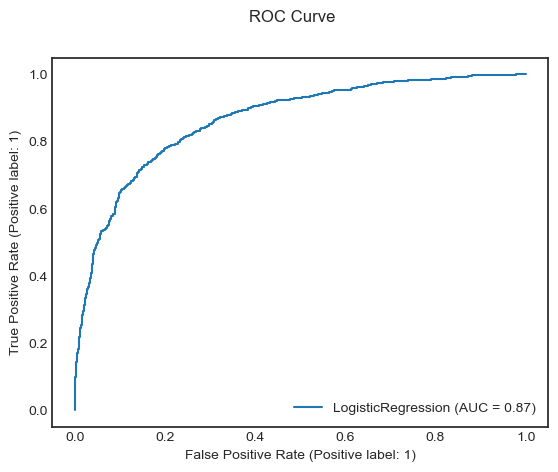

In [247]:
auc = metrics.plot_roc_curve(Final_Model, x_test, y_test)
auc.figure_.suptitle("ROC Curve")
plt.show()

**Confusion Matrix**

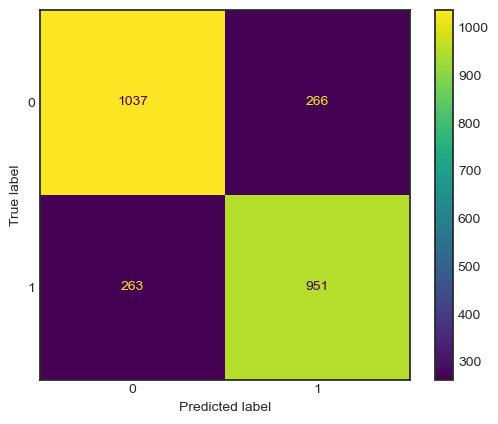

In [246]:
metrics_n = df.columns
metrics.plot_confusion_matrix(Classifier, x_test, y_test)

plt.show()

**Saving Final model**

In [248]:
import joblib
filename = "Final_DT.pkl"
joblib.dump(Final_Model, filename)

['Final_DT.pkl']

# Regression Model

In [249]:
X = df.drop('Rainfall', axis=1)
Y = df['Rainfall']

**Features Scaling**

In [250]:
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X.head()

,Location,MinTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,-1.388983,0.063619,1.219289,0.476724,1.314704,1.372385,0.823549,0.753224,0.203474,-1.553598,1.496899,1.496899,1.496899,1.496899,-0.534045,-0.536193,-1.771346,1.647645,-1.673223
1,-1.388983,-1.017184,1.410222,0.476724,-0.224700,1.595380,-0.638495,0.532563,-1.391310,-1.389084,0.013887,0.013887,0.013887,0.013887,-0.534045,-0.536193,-1.771346,1.647645,-1.559524
2,-1.388983,-0.026448,1.601154,0.639624,1.314704,1.595380,0.773842,0.973885,-1.745706,-1.114893,0.013887,0.013887,0.013887,0.013887,-0.534045,-0.536193,-1.771346,1.647645,-1.445824
3,-1.388983,-0.692943,-0.499107,-1.152275,0.435045,-1.749550,0.253420,-0.901732,-1.332244,-1.882627,0.013887,0.013887,0.013887,0.013887,-0.534045,-0.536193,-1.771346,1.647645,-1.332125
4,-1.388983,0.802168,1.219289,0.232374,-1.324275,-0.188582,-0.159662,0.311903,0.853200,-0.950379,1.092058,1.092058,1.092058,1.092058,-0.534045,-0.536193,-1.771346,1.647645,-1.218426


In [251]:
#Importing Libraries for Regression Model
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

**Finding Maximum Accuracy**

In [252]:
maxAccu=0
maxRS=0

for i in range(1, 1000):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=i)
    lr=LinearRegression()
    lr.fit(X_train, Y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(Y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best R2 score is", maxAccu,"on Random State", maxRS)


Best R2 score is 0.8152804141520248 on Random State 921


**Defining function for Regression**

In [253]:
def reg(model, X, Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=672)
    
    # Training the model
    model.fit(X_train, Y_train)
    
    # Predicting Y_test
    pred = model.predict(X_test)
    
    # RMSE - a lower RMSE score is better than a higher one
    rmse = mean_squared_error(Y_test, pred, squared=False)
    print("RMSE Score is:", rmse)
    
    # R2 score
    r2 = r2_score(Y_test, pred, multioutput='variance_weighted')*100
    print("R2 Score is:", r2)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, X, Y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of r2 score minus cv score
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)

**Linear Regression**

In [254]:
model=LinearRegression()
reg(model, X, Y)

RMSE Score is: 0.4115017620856667
R2 Score is: 78.51910091668526
Cross Validation Score: 78.30269053427668
R2 Score - Cross Validation Score is 0.2164103824085828


**Ridge Regression**

In [255]:
model=Ridge(alpha=1e-2, normalize=True)
reg(model, X, Y)

RMSE Score is: 0.41177800533717995
R2 Score is: 78.49025076000619
Cross Validation Score: 78.2917885884341
R2 Score - Cross Validation Score is 0.19846217157208912


**Lasso Regression**

In [256]:
model=Lasso(alpha=1e-2, normalize=True)
reg(model, X, Y)

RMSE Score is: 0.8314608093170013
R2 Score is: 12.30140742018201
Cross Validation Score: 8.594536942427618
R2 Score - Cross Validation Score is 3.706870477754391


**Random Forest Regressor**

In [257]:
# Random Forest Regressor

model=RandomForestRegressor(max_depth=2, max_features="sqrt")
reg(model, X, Y)

RMSE Score is: 0.5804393948612021
R2 Score is: 57.26115142759232
Cross Validation Score: 57.74662841411665
R2 Score - Cross Validation Score is -0.4854769865243327


**KNeighbors Regressor**

In [258]:
# K Neighbors Regressor

KNeighborsRegressor(n_neighbors=2, algorithm='kd_tree')
reg(model, X, Y)

RMSE Score is: 0.5606161462541812
R2 Score is: 60.13054861457772
Cross Validation Score: 57.51285954958022
R2 Score - Cross Validation Score is 2.6176890649974993


**Gradient Boosting Regressor**

In [259]:
# Gradient Boosting Regressor

model=GradientBoostingRegressor(loss='quantile', n_estimators=200, max_depth=5)
reg(model, X, Y)

RMSE Score is: 0.5689436306157839
R2 Score is: 58.93729680659454
Cross Validation Score: 43.15305924818566
R2 Score - Cross Validation Score is 15.784237558408876


**Support Vector Regressor**

In [260]:
# Support Vector Regression

model=SVR(C=1.0, epsilon=0.2, kernel='poly', gamma='auto')
reg(model, X, Y)

RMSE Score is: 0.43985315885882525
R2 Score is: 75.45717860861636
Cross Validation Score: 72.1942979437633
R2 Score - Cross Validation Score is 3.262880664853057


**Hyperparameter tuning on Final Model**

In [ ]:
LinearRegression()

In [274]:
fmod_param = {'n_jobs' : [-1,-2,-3,-4],
              'fit_intercept' : ['True','False'],
              'positive':["True","False"],
              'copy_X' : ['True','False']}

In [275]:
GSCV = GridSearchCV(LinearRegression(), fmod_param, cv=5)

In [276]:
GSCV.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'copy_X': ['True', 'False'],
                         'fit_intercept': ['True', 'False'],
                         'n_jobs': [-1, -2, -3, -4],
                         'positive': ['True', 'False']})

In [277]:
GSCV.best_params_

{'copy_X': 'True', 'fit_intercept': 'True', 'n_jobs': -1, 'positive': 'True'}

In [279]:
Final_Model = LinearRegression(copy_X='True', fit_intercept='True', n_jobs=-1,positive='True')
Classifier = Final_Model.fit(X_train, Y_train)
fmod_pred = Final_Model.predict(X_test)
fmod_r2 = r2_score(Y_test, fmod_pred)*100
print("R2 score for the Best Model is:", fmod_r2)


R2 score for the Best Model is: 79.43819605535143


**Saving Final Model**

In [280]:
filename = "FinalModel_Regression_E5.pkl"
joblib.dump(Final_Model, filename)


['FinalModel_Regression_E5.pkl']

**Model is completed**

**Thanku for Evaluating Model**